In [ ]:
### Can't plot in BNG, because tilemapbase just uses WM (and this is needed to supply basemap)
# Can plot without a basemap though

In [24]:
def find_cornerpoint_coordinates_obs (cube):
    '''
    Description
    ----------
        Using a cube of lat, longs in rotated pole and associated values the function
        creates new 2D lat, lon and data arrays in which the data values are associated
        with a point at the bottom left of each grid cell, rather than the middle.
    Parameters
    ----------
        cube: Iris Cube
            A cube containing only latitude and longitude dimensions
            In rotated pole coordinates so that...are constant..
    Returns
    -------
        lats_wm_midpoints_2d : array
            A 2d array of the mid point latitudes
        lons_wm_midpoints_2d : array
            A 2d array of the mid point longitudes
        
    '''
    
    # Extract lats and longs in rotated pol as a 2D array
    lats_1d = cube.coord('projection_y_coordinate').points
    lons_1d = cube.coord('projection_x_coordinate').points
    
    # Find the distance between each lat/lon and the next lat/lon
    # Divide this by two to get the distance to the half way point
    lats_differences_half = np.diff(lats_1d)/2
    lons_differences_half = np.diff(lons_1d)/2
    
    # Create an array of lats/lons at the midpoints
    lats_midpoints_1d = lats_1d[1:] - lats_differences_half
    lons_midpoints_1d = lons_1d[1:] - lons_differences_half
    
    # Convert to 2D
    lons_midpoints_2d, lats_midpoints_2d = np.meshgrid(lons_midpoints_1d, lats_midpoints_1d)

    # Convert to web mercator
    transformer = Transformer.from_crs("EPSG:27700", "EPSG:3857", always_xy=True)
    lons_wm_midpoints_2d, lats_wm_midpoints_2d = transformer.transform(lons_midpoints_2d, lats_midpoints_2d)
    
    # Convert to 1d     
    lons_wm_midpoints_1d = lons_wm_midpoints_2d.reshape(-1)
    lats_wm_midpoints_1d = lats_wm_midpoints_2d.reshape(-1)
    
    # Remove same parts of data
    data = cube.data
    data_midpoints = data[1:,1:]
    
    return (lats_wm_midpoints_2d, lons_wm_midpoints_2d)

def find_cornerpoint_coordinates_obs_bng (cube):
    '''
    Description
    ----------
        Using a cube of lat, longs in rotated pole and associated values the function
        creates new 2D lat, lon and data arrays in which the data values are associated
        with a point at the bottom left of each grid cell, rather than the middle.
    Parameters
    ----------
        cube: Iris Cube
            A cube containing only latitude and longitude dimensions
            In rotated pole coordinates so that...are constant..
    Returns
    -------
        lats_wm_midpoints_2d : array
            A 2d array of the mid point latitudes
        lons_wm_midpoints_2d : array
            A 2d array of the mid point longitudes
        
    '''
    
    # Extract lats and longs in rotated pol as a 2D array
    lats_1d = cube.coord('projection_y_coordinate').points
    lons_1d = cube.coord('projection_x_coordinate').points
    
    # Find the distance between each lat/lon and the next lat/lon
    # Divide this by two to get the distance to the half way point
    lats_differences_half = np.diff(lats_1d)/2
    lons_differences_half = np.diff(lons_1d)/2
    
    # Create an array of lats/lons at the midpoints
    lats_midpoints_1d = lats_1d[1:] - lats_differences_half
    lons_midpoints_1d = lons_1d[1:] - lons_differences_half
    
    # Convert to 2D
    lons_midpoints_2d, lats_midpoints_2d = np.meshgrid(lons_midpoints_1d, lats_midpoints_1d)

    # Convert to web mercator
    transformer = Transformer.from_crs("EPSG:27700", "EPSG:3857", always_xy=True)
    lons_wm_midpoints_2d, lats_wm_midpoints_2d = transformer.transform(lons_midpoints_2d, lats_midpoints_2d)
    
    # Convert to 1d     
    lons_wm_midpoints_1d = lons_wm_midpoints_2d.reshape(-1)
    lats_wm_midpoints_1d = lats_wm_midpoints_2d.reshape(-1)
    
    # Remove same parts of data
    data = cube.data
    data_midpoints = data[1:,1:]
    
    return (lats_midpoints_2d, lons_midpoints_2d)

def calculate_bounding_box(latitude, longitude, distance_km):
    # Earth's radius in kilometers
    earth_radius_km = 6371.01

    # Calculate the change in latitude for the given distance
    delta_lat = distance_km / earth_radius_km * (180 / 3.141592653589793)

    # Calculate the change in longitude, adjusting for the latitude
    delta_lon = distance_km / (earth_radius_km * cos(radians(latitude))) * (180 / 3.141592653589793)

    # Calculate bounding box coordinates
    min_lat = latitude - delta_lat
    max_lat = latitude + delta_lat
    min_lon = longitude - delta_lon
    max_lon = longitude + delta_lon

    return min_lat, max_lat, min_lon, max_lon

def create_geodataframe_from_bbox(min_lat, max_lat, min_lon, max_lon):
    # Create a Polygon from the bounding box coordinates
    bbox_polygon = Polygon([(min_lon, min_lat), (min_lon, max_lat), 
                            (max_lon, max_lat), (max_lon, min_lat), 
                            (min_lon, min_lat)])
    
    # Create a GeoDataFrame with the Polygon
    gdf = gpd.GeoDataFrame(index=[0], crs='EPSG:4326', geometry=[bbox_polygon])
    
    return gdf


def find_position_obs (concat_cube, rain_gauge_lat, rain_gauge_lon):
    lat_length = concat_cube.shape[0]
    lon_length = concat_cube.shape[1]
    
    ### Rain gauge data 
    # Convert WGS84 coordinate to BNG
    transformer = Transformer.from_crs("EPSG:4326", "EPSG:27700", always_xy=True)
    # Use the transformer to convert longitude and latitude to British National Grid coordinates
    rain_gauge_lon_bng, rain_gauge_lat_bng = transformer.transform(rain_gauge_lon, rain_gauge_lat)
    
    # Create as a list
    rain_gauge_point = [('grid_latitude', rain_gauge_lat_bng), ('grid_longitude', rain_gauge_lon_bng)]
                 
    ### Model data
    # Create a list of all the tuple pairs of latitude and longitudes
    locations = list(itertools.product(concat_cube.coord('projection_y_coordinate').points,
                                       concat_cube.coord('projection_x_coordinate').points))
    
    # Find the index of the nearest neighbour of the rain gague location point in the list of locations present in concat_cube
    tree = spatial.KDTree(locations)
    closest_point_idx = tree.query([(rain_gauge_point[0][1], rain_gauge_point[1][1])], k =1)[1][0]
    
    # Create a list of all the tuple positions
    indexs_lst = []
    for i in range(0,lat_length):
        for j in range(0,lon_length):
            # Print the position
            #print(i,j)
            indexs_lst.append((i,j))
              
    ######## Check by plotting 
    # Get cube containing one hour worth of data
    hour_uk_cube = concat_cube

    # Set all the values to 0
    test_data = np.full((hour_uk_cube.shape),0,dtype = int)
    # Set the values at the index position fond above to 1
    test_data[indexs_lst[closest_point_idx][0],indexs_lst[closest_point_idx][1]] = 1
    # Mask out all values that aren't 1
    test_data = ma.masked_where(test_data<1,test_data)
    
    # Set the dummy data back on the cube
    hour_uk_cube.data = test_data
    
    # Find cornerpoint coordinates (for use in plotting)
    lats_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[0]
    lons_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[1]
    
    # Trim the data timeslice to be the same dimensions as the corner coordinates
    hour_uk_cube = hour_uk_cube[1:,1:]
    test_data = hour_uk_cube.data

    # Create location in web mercator for plotting
    transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
    lon_rain_gauge_wm, lat_rain_gauge_wm = transformer.transform(rain_gauge_lon,rain_gauge_lat)
        
    # Create bounding box to centre the map on
    min_lat, max_lat, min_lon, max_lon = calculate_bounding_box(rain_gauge_lat, rain_gauge_lon, distance_km =30)
    gdf_bbox = create_geodataframe_from_bbox(min_lat, max_lat, min_lon, max_lon)
    gdf_bbox_web_mercator = gdf_bbox.to_crs(epsg=3857)
        
    # Create a colormap
    cmap = matplotlib.colors.ListedColormap(['red'])
    
    fig, ax = plt.subplots(figsize=(15,15))
    extent = tilemapbase.extent_from_frame(gdf_bbox_web_mercator)
    plot = plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=500)
    plot =plotter.plot(ax)
    # # Add edgecolor = 'grey' for lines
    plot =ax.pcolormesh(lons_cornerpoints, lats_cornerpoints, test_data,
          linewidths=0.4, alpha = 1, cmap = cmap, edgecolors = 'grey')
    plot = ax.xaxis.set_major_formatter(plt.NullFormatter())
    plot = ax.yaxis.set_major_formatter(plt.NullFormatter())
    #plot =leeds_at_centre_gdf.plot(ax=ax, categorical=True, alpha=1, edgecolor='black', color='none', linewidth=2)
    plt.plot(lon_rain_gauge_wm, lat_rain_gauge_wm, 'o', color='black', markersize = 10)     
    plt.show()
 
    return closest_point_idx   

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from warnings import simplefilter
warnings.filterwarnings("ignore", category =UserWarning,)

from pyproj import Transformer
import numpy as np
import pandas as pd
import iris
import glob
import sys
import os
import cartopy.crs as ccrs
import itertools
from scipy import spatial
import numpy.ma as ma
import tilemapbase
import iris.plot as iplt
from math import cos, radians
import geopandas as gpd
from shapely.geometry import Polygon

In [3]:
# Set up path to root directory
root_fp = "/nfs/a319/gy17m2a/PhD/"
os.chdir(root_fp)

sys.path.insert(0, root_fp + 'Scripts/GlobalFunctions')
from Spatial_plotting_functions import *
from Spatial_geometry_functions import *

### Get model data

In [4]:
em = '01'
in_jja=iris.Constraint(time=lambda cell: 6 <= cell.point.month <= 8)

yrs_range = "1980_2001"
yrs= range(1981,2002)

resolution = '2.2km_bng' #2.2km, 12km, 2.2km_regridded_12km
regridding_style = 'AreaWeighted'

gb_gdf = create_gb_outline({'init' :'epsg:3857'})
# This is a square area surrounding Leeds
leeds_at_centre_gdf = create_leeds_at_centre_outline({'init' :'epsg:3857'})
leeds_at_centre_bng_gdf = create_leeds_at_centre_outline({'init' :'epsg:27700'})

yr = 1985
general_filename = f'/nfs/a319/gy17m2a/PhD/datadir/UKCP18_hourly/{resolution}/{em}/{yrs_range}/bng_pr_rcp85_land-cpm_uk_2.2km_{em}_1hr_{yr}*'

filenames = []
for filename in glob.glob(general_filename):
    filenames.append(filename)
print(f"loading {len(filenames)} files")

# ### Load in the data
monthly_cubes_list = iris.load(filenames, in_jja)
print(len(monthly_cubes_list))

for cube in monthly_cubes_list:
     for attr in ['creation_date', 'tracking_id', 'history', 'Conventions']:
            if attr in cube.attributes:
                del cube.attributes[attr]

# ### Concatenate cubes into one
model_cube = monthly_cubes_list.concatenate_cube()      

### Remove ensemble member dimension
if len(model_cube.shape)>3:
    model_cube = model_cube[0,:,:,:]  
    
model_cube = trim_to_bbox_of_region_obs(model_cube, gb_gdf, 'projection_y_coordinate', 'projection_x_coordinate')

masked_cube_onets =model_cube[0,:,:]

loading 3 files
3


### Get gauge data

In [5]:
# Replace 'your_file_path.txt' with the path to your text file
file_path = '/nfs/a319/gy17m2a/PhD/datadir/RainGauge/interarrival_thresholds_CDD_noMissing.txt'

# Read the CSV data into a DataFrame
tbo_vals = pd.read_csv(file_path)

gauge1 = tbo_vals.iloc[1:2]

### Find grid cell containing the gauge1

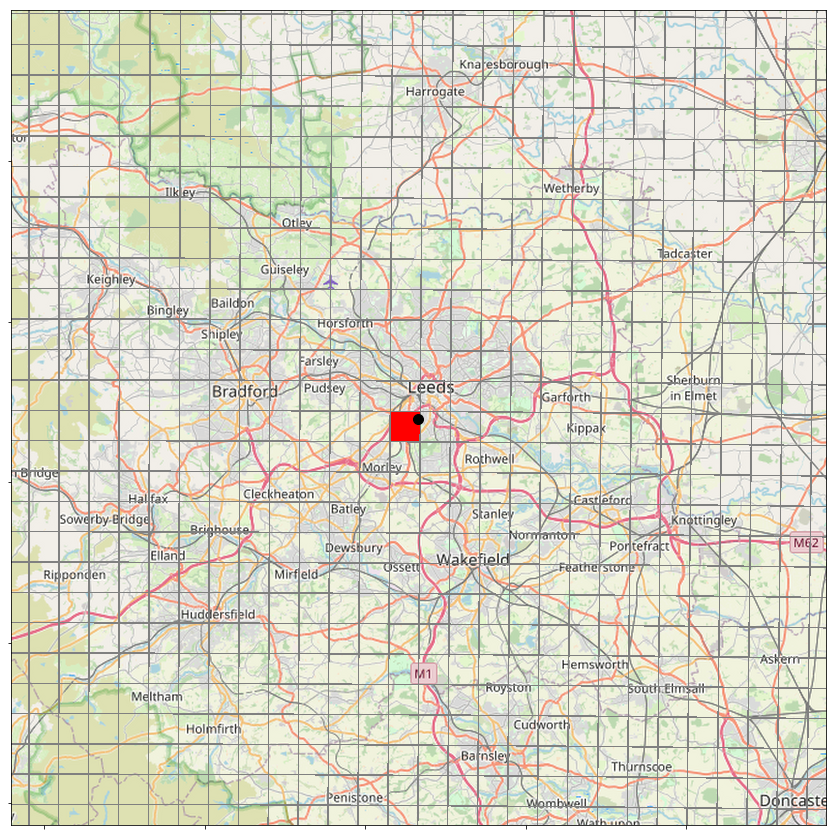

In [25]:
lat = 53.77629137074897 # gauge1['Lat']
lon = -1.5572885764574744 # gauge1['Lon']

closest_point_idx = find_position_obs(masked_cube_onets,lat, lon )

### Try to plot in BNG
This was working, but now they are coming out as different shapes, not sure why, but code is maybe not needed anyway

In [47]:
lat = 53.77629137074897 # gauge1['Lat']
lon = -1.5572885764574744 # gauge1['Lon']

In [50]:
concat_cube = masked_cube_onets
lat_length = concat_cube.shape[0]
lon_length = concat_cube.shape[1]

transformer = Transformer.from_crs("EPSG:4326", "EPSG:27700", always_xy=True)
# Use the transformer to convert longitude and latitude to British National Grid coordinates
lon_bng, lat_bng = transformer.transform(lon, lat)

# Create as a list
sample_point = [('grid_latitude', lat_bng), ('grid_longitude', lon_bng)]

# Create a list of all the tuple pairs of latitude and longitudes
locations = list(itertools.product(concat_cube.coord('projection_y_coordinate').points,
                                   concat_cube.coord('projection_x_coordinate').points))

# Find the index of the nearest neighbour of the sample point in the list of locations present in concat_cube
tree = spatial.KDTree(locations)
closest_point_idx = tree.query([(sample_point[0][1], sample_point[1][1])], k =1)[1][0]

# Create a list of all the tuple positions
indexs_lst = []
for i in range(0,lat_length):
    for j in range(0,lon_length):
        # Print the position
        #print(i,j)
        indexs_lst.append((i,j))

######## Check plotting 
# Get cube containing one hour worth of data
hour_uk_cube = concat_cube

# Set all the values to 0
test_data = np.full((hour_uk_cube.shape),0,dtype = int)
# Set the values at the index position fond above to 1
test_data[indexs_lst[closest_point_idx][0],indexs_lst[closest_point_idx][1]] = 1
# Mask out all values that aren't 1
test_data = ma.masked_where(test_data<1,test_data)

# Set the dummy data back on the cube
hour_uk_cube.data = test_data

# Trim the data timeslice to be the same dimensions as the corner coordinates
hour_uk_cube = hour_uk_cube[1:,1:]
test_data = hour_uk_cube.data

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Central point in OSGB coordinates
center_x, center_y = 429273.518537685, 431195.3533804001

# Distance from the center to each edge of the box (5 km = 5000 meters)
half_box_side = 20000

# Calculate the bounds of the box
west = center_x - half_box_side
east = center_x + half_box_side
south = center_y - half_box_side
north = center_y + half_box_side

# Find cornerpoint coordinates (for use in plotting)
lats_cornerpoints = find_cornerpoint_coordinates_obs_bng(hour_uk_cube)[0]
lons_cornerpoints = find_cornerpoint_coordinates_obs_bng(hour_uk_cube)[1]

# Define the extent [west, east, south, north] in OSGB coordinates
extent_osgb = [west, east, south, north]

fig = plt.figure(figsize=(30, 20))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.OSGB())

# Set the extent using the defined bounds
ax.set_extent(extent_osgb, crs=ccrs.OSGB())

# Here, add your plotting code for pcolormesh, points, etc.
# Example placeholder for pcolormesh (you'll replace lons_cornerpoints, lats_cornerpoints, test_data with your actual data)
# # Add edgecolor = 'grey' for lines
ax.pcolormesh(lons_cornerpoints, lats_cornerpoints, test_data,
      linewidths=0.4, alpha = 1, cmap = cmap, edgecolors = 'grey')
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.xaxis.set_major_formatter(plt.NullFormatter())
ax.yaxis.set_major_formatter(plt.NullFormatter())

# Plot the center point (make sure to convert or confirm it's in OSGB if necessary)
plt.plot(center_x, center_y, 'o', color='black', markersize=10)

plt.show()

(520, 423)

In [73]:
concat_cube = masked_cube_onets
lat_length = concat_cube.shape[0]
lon_length = concat_cube.shape[1]
# Convert WGS84 coordinate to BNG
transformer = Transformer.from_crs("EPSG:4326", "EPSG:27700", always_xy=True)
# Use the transformer to convert longitude and latitude to British National Grid coordinates
lon_bng, lat_bng = transformer.transform(lon, lat)

# Create as a list
sample_point = [('grid_latitude', lat_bng), ('grid_longitude', lon_bng)]

# Create a list of all the tuple pairs of latitude and longitudes
locations = list(itertools.product(concat_cube.coord('projection_y_coordinate').points,
                                   concat_cube.coord('projection_x_coordinate').points))

# Find the index of the nearest neighbour of the sample point in the list of locations present in concat_cube
tree = spatial.KDTree(locations)
closest_point_idx = tree.query([(sample_point[0][1], sample_point[1][1])], k =1)[1][0]

# Create a list of all the tuple positions
indexs_lst = []
for i in range(0,lat_length):
    for j in range(0,lon_length):
        # Print the position
        #print(i,j)
        indexs_lst.append((i,j))

######## Check plotting 
# Get cube containing one hour worth of data
hour_uk_cube = concat_cube

# Set all the values to 0
test_data = np.full((hour_uk_cube.shape),0,dtype = int)
# Set the values at the index position fond above to 1
test_data[indexs_lst[closest_point_idx][0],indexs_lst[closest_point_idx][1]] = 1
# Mask out all values that aren't 1
test_data = ma.masked_where(test_data<1,test_data)

# Set the dummy data back on the cube
hour_uk_cube.data = test_data

# Find cornerpoint coordinates (for use in plotting)
lats_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[0]
lons_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[1]

# Trim the data timeslice to be the same dimensions as the corner coordinates
hour_uk_cube = hour_uk_cube[1:,1:]
test_data = hour_uk_cube.data

In [75]:
extent

[-2.0491, -1.0491, 53.3008, 54.3008]

AttributeError: module 'cartopy.feature' has no attribute 'MOUNTAINS'

/nfs/a321/gy17m2a/anaconda_install/anaconda3/envs/ukcp18/lib/python3.7/site-packages/cartopy/io/__init__.py:260: DownloadWarning: Downloading: https://naciscdn.org/naturalearth/10m/physical/ne_10m_rivers_lake_centerlines.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)
/nfs/a321/gy17m2a/anaconda_install/anaconda3/envs/ukcp18/lib/python3.7/site-packages/cartopy/io/__init__.py:260: DownloadWarning: Downloading: https://naciscdn.org/naturalearth/10m/physical/ne_10m_lakes.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


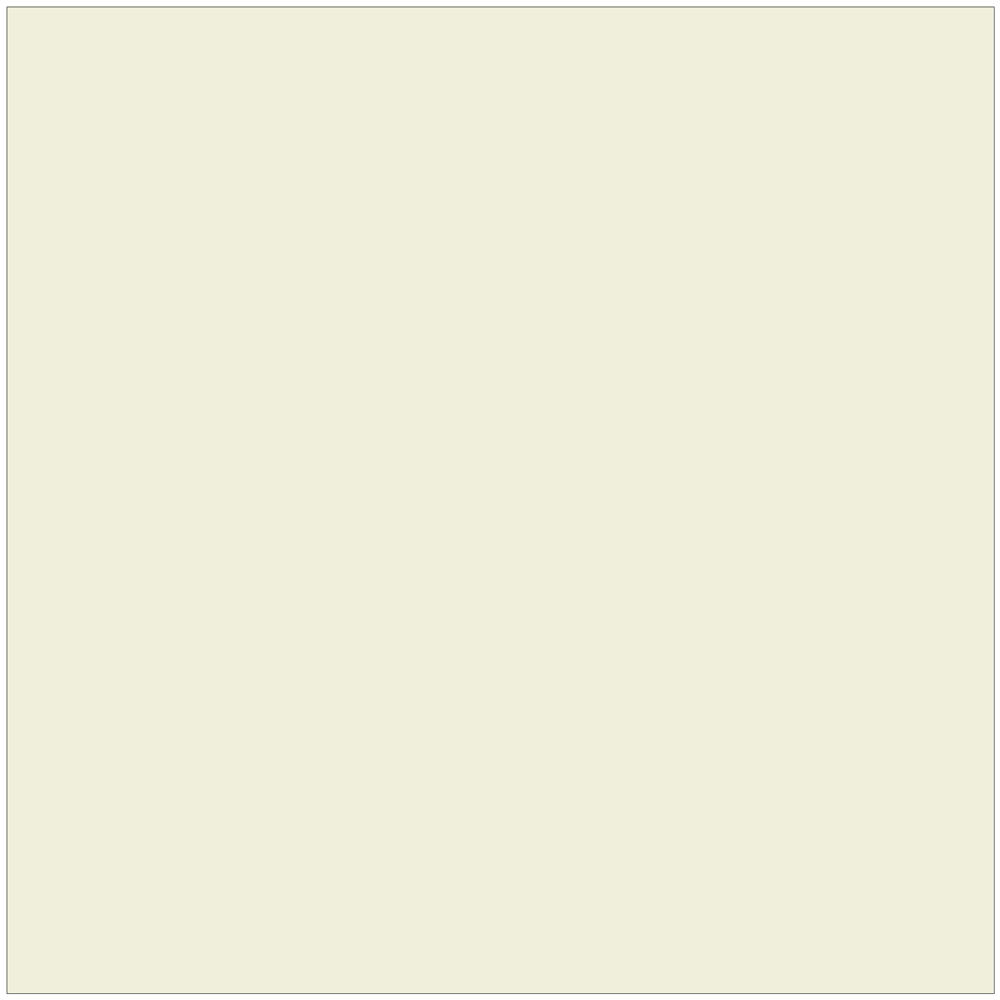

TypeError: Dimensions of C (520, 423) are incompatible with X (422) and/or Y (519); see help(pcolormesh)

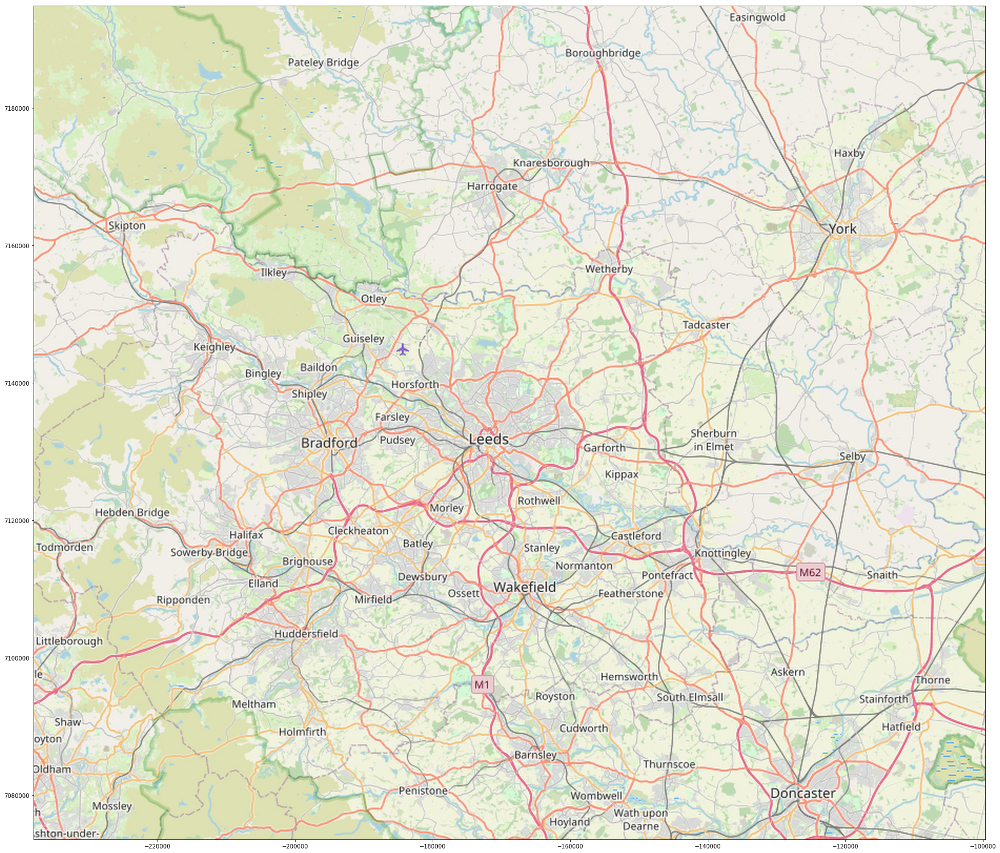

In [85]:
# concat_cube = masked_cube_onets

# lat_length = concat_cube.shape[0]
# lon_length = concat_cube.shape[1]
# # Convert WGS84 coordinate to BNG
# transformer = Transformer.from_crs("EPSG:4326", "EPSG:27700")
# # Use the transformer to convert longitude and latitude to British National Grid coordinates
# lat_bng, lon_bng = transformer.transform(lat, lon)

# # Create as a list
# sample_point = [('grid_latitude', lat_bng), ('grid_longitude', lon_bng)]

# # Create a list of all the tuple pairs of latitude and longitudes
# locations = list(itertools.product(concat_cube.coord('projection_y_coordinate').points,
#                                    concat_cube.coord('projection_x_coordinate').points))

# # Find the index of the nearest neighbour of the sample point in the list of locations present in concat_cube
# tree = spatial.KDTree(locations)
# closest_point_idx = tree.query([(sample_point[0][1], sample_point[1][1])], k =1)[1][0]

# # Create a list of all the tuple positions
# indexs_lst = []
# for i in range(0,lat_length):
#     for j in range(0,lon_length):
#         # Print the position
#         #print(i,j)
#         indexs_lst.append((i,j))

# ######## Check plotting 
# # Get cube containing one hour worth of data
# hour_uk_cube = concat_cube

# # Set all the values to 0
# test_data = np.full((hour_uk_cube.shape),0,dtype = int)
# # Set the values at the index position fond above to 1
# test_data[indexs_lst[closest_point_idx][0],indexs_lst[closest_point_idx][1]] = 1
# # Mask out all values that aren't 1
# test_data = ma.masked_where(test_data<1,test_data)

# # Set the dummy data back on the cube
# hour_uk_cube.data = test_data

# # Find cornerpoint coordinates (for use in plotting)
# lats_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[0]
# lons_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[1]

# # Trim the data timeslice to be the same dimensions as the corner coordinates
# hour_uk_cube = hour_uk_cube[1:,1:]
# test_data = hour_uk_cube.data

# # Create location in web mercator for plotting
# transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")
# lat_wm, lon_wm = transformer.transform(lat, lon)

# # Create a colormap
# cmap = matplotlib.colors.ListedColormap(['red'])

fig, ax = plt.subplots(figsize=(30,30))
extent = tilemapbase.extent_from_frame(leeds_at_centre_gdf)
plot = plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=500)
plot =plotter.plot(ax)
# # Add edgecolor = 'grey' for lines
plot =ax.pcolormesh(lons_cornerpoints, lats_cornerpoints, test_data,
      linewidths=0.4, alpha = 1, cmap = cmap, edgecolors = 'grey')
plot = ax.xaxis.set_major_formatter(plt.NullFormatter())
plot = ax.yaxis.set_major_formatter(plt.NullFormatter())
plot =leeds_at_centre_gdf.plot(ax=ax, categorical=True, alpha=1, edgecolor='black', color='none', linewidth=2)
plt.plot(lat_wm, lon_wm,  'o', color='black', markersize = 10)     
#plt.savefig('Scripts/UKCP18/RainGaugeAnalysis/Figs/CheckingLocations/CEH-GEAR/{}.png'.format(station_name),
#            bbox_inches = 'tight')
plt.show()

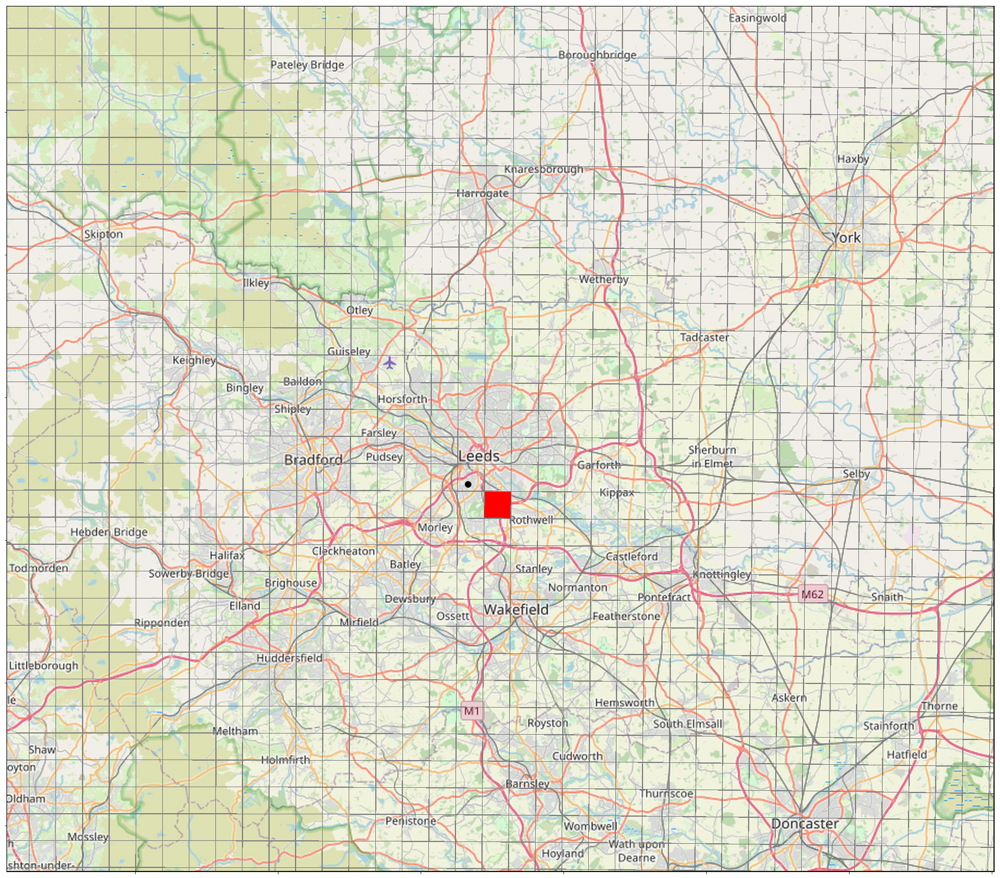

In [84]:
# concat_cube = masked_cube_onets

# lat_length = concat_cube.shape[0]
# lon_length = concat_cube.shape[1]
# # Convert WGS84 coordinate to BNG
# transformer = Transformer.from_crs("EPSG:4326", "EPSG:27700")
# # Use the transformer to convert longitude and latitude to British National Grid coordinates
# lat_bng, lon_bng = transformer.transform(lat, lon)

# # Create as a list
# sample_point = [('grid_latitude', lat_bng), ('grid_longitude', lon_bng)]

# # Create a list of all the tuple pairs of latitude and longitudes
# locations = list(itertools.product(concat_cube.coord('projection_y_coordinate').points,
#                                    concat_cube.coord('projection_x_coordinate').points))

# # Find the index of the nearest neighbour of the sample point in the list of locations present in concat_cube
# tree = spatial.KDTree(locations)
# closest_point_idx = tree.query([(sample_point[0][1], sample_point[1][1])], k =1)[1][0]

# # Create a list of all the tuple positions
# indexs_lst = []
# for i in range(0,lat_length):
#     for j in range(0,lon_length):
#         # Print the position
#         #print(i,j)
#         indexs_lst.append((i,j))

# ######## Check plotting 
# # Get cube containing one hour worth of data
# hour_uk_cube = concat_cube

# # Set all the values to 0
# test_data = np.full((hour_uk_cube.shape),0,dtype = int)
# # Set the values at the index position fond above to 1
# test_data[indexs_lst[closest_point_idx][0],indexs_lst[closest_point_idx][1]] = 1
# # Mask out all values that aren't 1
# test_data = ma.masked_where(test_data<1,test_data)

# # Set the dummy data back on the cube
# hour_uk_cube.data = test_data

# # Find cornerpoint coordinates (for use in plotting)
# lats_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[0]
# lons_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[1]

# # Trim the data timeslice to be the same dimensions as the corner coordinates
# hour_uk_cube = hour_uk_cube[1:,1:]
# test_data = hour_uk_cube.data

# # Create location in web mercator for plotting
# transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857")
# lat_wm, lon_wm = transformer.transform(lat, lon)

# # Create a colormap
# cmap = matplotlib.colors.ListedColormap(['red'])

lats = hour_uk_cube.coord('projection_y_coordinate').points
lons = hour_uk_cube.coord('projection_x_coordinate').points
xx,yy=np.meshgrid(lons, lats)

fig, ax = plt.subplots(figsize=(30,30))
extent = tilemapbase.extent_from_frame(leeds_at_centre_gdf)
plot = plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=500)
plot =plotter.plot(ax)
# # Add edgecolor = 'grey' for lines
plot =ax.pcolormesh(xx_wm, yy_wm,
                    test_data,
      linewidths=0.4, alpha = 1, cmap = cmap, edgecolors = 'grey')
plot = ax.xaxis.set_major_formatter(plt.NullFormatter())
plot = ax.yaxis.set_major_formatter(plt.NullFormatter())
plot =leeds_at_centre_gdf.plot(ax=ax, categorical=True, alpha=1, edgecolor='black', color='none', linewidth=2)
plt.plot(lat_wm, lon_wm,  'o', color='black', markersize = 10)     
#plt.savefig('Scripts/UKCP18/RainGaugeAnalysis/Figs/CheckingLocations/CEH-GEAR/{}.png'.format(station_name),
#            bbox_inches = 'tight')
plt.show()

In [ ]:
# concat_cube = masked_cube_onets
# lat = 53.77629137074897 # gauge1['Lat']
# lon = -1.5572885764574744 # gauge1['Lon']


# lat_length = concat_cube.shape[0]
# lon_length = concat_cube.shape[1]
# # Convert WGS84 coordinate to BNG
# lon_bng,lat_bng = transform(Proj(init = 'epsg:4326') , Proj(init = 'epsg:27700'),
#                             lon, lat)
# # lon_bng = lon_bng[0]
# # lat_bng = lat_bng[0]

# # Create as a list
# sample_point = [('grid_latitude', lat_bng), ('grid_longitude', lon_bng)]
# print(sample_point)

# # Create a list of all the tuple pairs of latitude and longitudes
# locations = list(itertools.product(concat_cube.coord('projection_y_coordinate').points,
#                                    concat_cube.coord('projection_x_coordinate').points))

# # Find the index of the nearest neighbour of the sample point in the list of locations present in concat_cube
# tree = spatial.KDTree(locations)
# closest_point_idx = tree.query([(sample_point[0][1], sample_point[1][1])], k =1)[1][0]

# # Create a list of all the tuple positions
# indexs_lst = []
# for i in range(0,lat_length):
#     for j in range(0,lon_length):
#         # Print the position
#         #print(i,j)
#         indexs_lst.append((i,j))

# # # Extract the lat and long values of this point using the index
# # filename = "Outputs/TimeSeries/CEH-GEAR/1km/leeds-at-centre/{}_{}.npy".format(indexs_lst[closest_point_idx][0],indexs_lst[closest_point_idx][1])
# # data_slice = np.load(filename)

# hour_uk_cube = concat_cube

# # Set all the values to 0
# test_data = np.full((hour_uk_cube.shape),0,dtype = int)
# # Set the values at the index position fond above to 1
# test_data[indexs_lst[closest_point_idx][0],indexs_lst[closest_point_idx][1]] = 1
# # Mask out all values that aren't 1
# test_data = ma.masked_where(test_data<1,test_data)

# # Set the dummy data back on the cube
# hour_uk_cube.data = test_data

# # Find cornerpoint coordinates (for use in plotting)
# lats_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[0]
# lons_cornerpoints = find_cornerpoint_coordinates_obs(hour_uk_cube)[1]

# # Trim the data timeslice to be the same dimensions as the corner coordinates
# hour_uk_cube = hour_uk_cube[1:,1:]
# test_data = hour_uk_cube.data

# # Create location in web mercator for plotting
# print('Creating plot')
# lon_wm,lat_wm = transform(Proj(init = 'epsg:4326') , Proj(init = 'epsg:3857') , lon, lat)

# # Create a colormap
# cmap = matplotlib.colors.ListedColormap(['red']) 

In [90]:
tilemapbase.init(create=True)
# t = tilemapbase.tiles.build_OSM()
my_office = (-4.54636, 57.89409)
degree_range = 1
extent = tilemapbase.Extent.from_lonlat(my_office[0] - degree_range, my_office[0] + degree_range,
                  my_office[1] - degree_range, my_office[1] + degree_range)
extent = extent.to_aspect(1.0)

In [123]:
# fig, ax = plt.subplots(figsize=(30,30))
# extent = tilemapbase.extent_from_frame(leeds_at_centre_gdf)
# plot = plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=500)
# plot =plotter.plot(ax)
# # # Add edgecolor = 'grey' for lines
# plot =ax.pcolormesh(lons_cornerpoints, lats_cornerpoints, test_data,
#       linewidths=0.4, alpha = 1, cmap = cmap, edgecolors = 'grey')
# plot = ax.xaxis.set_major_formatter(plt.NullFormatter())
# plot = ax.yaxis.set_major_formatter(plt.NullFormatter())
# plot =leeds_at_centre_gdf.plot(ax=ax, categorical=True, alpha=1, edgecolor='black', color='none', linewidth=2)
# for lat, lon in zip(lats, lons):
#     lon_wm,lat_wm = transform(Proj(init = 'epsg:4326') , Proj(init = 'epsg:3857') , lon, lat)
#     plt.plot(lon_wm, lat_wm,  'o', color='black', markersize = 10)     


In [129]:
np.nanmax(hour_uk_cube.data.data)

1

In [ ]:
fig = plt.figure(figsize=(30, 20))
# Create the first subplot with one projection
ax = fig.add_subplot(1,1,1, projection=ccrs.OSGB())
extent = tilemapbase.extent_from_frame(leeds_at_centre_gdf)
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=500)
plotter.plot(ax)
ax.pcolormesh(lons, lats, hour_uk_cube.data.data,
      linewidths=0.4, alpha = 1, cmap = cmap, edgecolors = 'grey')

In [ ]:
# fig = plt.figure(figsize=(30, 20))
# # Create the first subplot with one projection
# ax = fig.add_subplot(1,1,1, projection=ccrs.OSGB())
# ax.coastlines()
# ax.set_title('BNG')
# lats = hour_uk_cube.coord('projection_y_coordinate').points
# lons = hour_uk_cube.coord('projection_x_coordinate').points
# xx,yy=np.meshgrid(lons, lats)
# ax.pcolormesh(lons, lats, hour_uk_cube.data.data,
#       linewidths=0.1, alpha = 1, cmap = cmap, edgecolors = 'grey')
# # ax.contourf(lons, lats, hour_uk_cube.data.data, transform=ccrs.OSGB())
# ax.plot(lat, lon)

In [124]:
# fig, ax = plt.subplots(figsize=(30,30))
# # plot = plotter = tilemapbase.Plotter(extent, t, width=600)
# # plot = plotter.plot(ax)
# # # # Add edgecolor = 'grey' for lines
# plot =ax.pcolormesh(lons_cornerpoints, lats_cornerpoints, test_data,
#       linewidths=0.4, alpha = 1, cmap = cmap, edgecolors = 'grey')
# # plot = ax.xaxis.set_major_formatter(plt.NullFormatter())
# # plot = ax.yaxis.set_major_formatter(plt.NullFormatter())
# # plot =leeds_at_centre_gdf.plot(ax=ax, categorical=True, alpha=1, edgecolor='black', color='none', linewidth=2)
# plt.plot(lon_wm, lat_wm,  'o', color='black', markersize = 10)     
# #plt.savefig('Scripts/UKCP18/RainGaugeAnalysis/Figs/CheckingLocations/CEH-GEAR/{}.png'.format(station_name),
# #            bbox_inches = 'tight')
# plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(30,30))
extent = tilemapbase.extent_from_frame(leeds_at_centre_gdf)
plot = plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=500)
plot =plotter.plot(ax)
# # Add edgecolor = 'grey' for lines
plot = ax.xaxis.set_major_formatter(plt.NullFormatter())
plot = ax.yaxis.set_major_formatter(plt.NullFormatter())
plot =leeds_at_centre_gdf.plot(ax=ax, categorical=True, alpha=1, edgecolor='black', color='none', linewidth=2)
plt.plot(lon_wm, lat_wm,  'o', color='black', markersize = 10)     
plot =ax.pcolormesh(lons_cornerpoints, lats_cornerpoints, test_data.data,
      linewidths=0.4, alpha = 1, cmap = cmap, edgecolors = 'grey')
#plt.savefig('Scripts/UKCP18/RainGaugeAnalysis/Figs/CheckingLocations/CEH-GEAR/{}.png'.format(station_name),
#            bbox_inches = 'tight')
plt.show()

In [68]:
find_position_obs(masked_cube_onets,gauge1['Lat'], gauge1['Lon'], 'blah' )

/nfs/a321/gy17m2a/anaconda_install/anaconda3/envs/ukcp18/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  


['grid_latitude', 200993.46149480034, 'grid_longitude', 486656.4955982631]


IndexError: invalid index to scalar variable.